# Template Notebook for using an Island Model GA with Style Evolution on Islands
Notebook Version: 0.7.0 (15/03/2025)
* include TensorboardEmbedVisualizer
* rename functions, conditionally save images
* show parent history of solutions

## Project Setup

In [1]:
from evolutionary.plotting import plot_fitness_statistics, plot_time_statistics
import evolutionary_imaging.processing as ip
import evolutionary_prompt_embedding.tensorboard_embed_visualizer as ev
from diffusers.utils import logging
from evolutionary_imaging.processing import create_animation_from_generations, create_generation_image_grid, save_images_from_generation
import torch
import os

In [2]:
logging.disable_progress_bar() # Or else your output will be full of progress bars
logging.set_verbosity_error() # Enable again if you are having problems
os.environ["TOKENIZERS_PARALLELISM"] = "false" # To remove warning of libraries using tokenizers
# Change the results folder for images and embedding visualization if you want to
# ip.RESULTS_FOLDER = "choose_your_destination"
# ev.DEFAULT_OUTPUT_FOLDER = "choose_your_destination"
# save_run_path = "saved_runs"

use_visualizer = True # Set to False if you don't want to use the TensorboardEmbedVisualizer
save_images = True # Set to False if you don't want to save images
print(torch.random.get_rng_state()) # Check torch random state, used across all libraries. Caution setting fixed seeds as it affects not only generation but also variation.

tensor([202,  27,  77,  ...,   0,   0,   0], dtype=torch.uint8)


In [3]:
from evolutionary_prompt_embedding.argument_types import PooledPromptEmbedData
from evolutionary_prompt_embedding.image_creation import SDXLPromptEmbeddingImageCreator
from evolutionary_prompt_embedding.variation import \
    UniformGaussianMutatorArguments, PooledUniformGaussianMutator, PooledArithmeticCrossover, PooledUniformCrossover
from evolutionary_prompt_embedding.value_ranges import SDXLTurboEmbeddingRange, SDXLTurboPooledEmbeddingRange
from evolutionary.evolutionary_selectors import TournamentSelector, RouletteWheelSelector, RankSelector
from evolutionary.evaluators import CappedEvaluator, GoalDiminishingEvaluator, MultiObjectiveEvaluator
from evolutionary.algorithms.island_model import IslandModel
from evolutionary.algorithms.ga import GeneticAlgorithm
from evolutionary.algorithms.nsga_ii import NSGA_II, NSGATournamentSelector
from evolutionary_imaging.evaluators import AIDetectionImageEvaluator, AestheticsImageEvaluator, SingleCLIPIQAEvaluator
from evolutionary_prompt_embedding.tensorboard_embed_visualizer import TensorboardEmbedVisualizer, EmbeddingVariant

visualizer = TensorboardEmbedVisualizer[PooledPromptEmbedData, [str, str, str, str]](["Index", "Generation", "Fitness", "Island"])

class IslandPostEvaluationCallback:
    """Class to contain post evaluation callbacks for islands; used to allow pickling"""
    def __init__(self, ident: int, description: str):
        self.ident = ident
        self.description = description

    def __call__(self, g, a):
        image_paths = None
        if save_images:
            image_paths = save_images_from_generation(a.population, g, self.ident)
        if use_visualizer:
            for i, s in enumerate(a.population):
                visualizer.add_embedding(s.arguments, [str(i), str(g), f"{s.fitness:.3f}", self.description], image_paths[i] if image_paths else None)

population_size = 10
num_generations = 100
batch_size = 1
elitism = None
inference_steps = 4
crossover_rate = 0.8
mutation_rate = 0.3
migration_size = 12
migration_interval = 5

artists_and_works = {
    "Vincent van Gogh": [
        "The Starry Night",
        "Sunflowers",
        "The Bedroom",
        "Irises",
        "Café Terrace at Night",
        "Wheatfield with Crows",
        "Self-Portrait with Bandaged Ear",
        "Almond Blossoms"
    ],
    "Pablo Picasso": [
        "Guernica",
        "Les Demoiselles d'Avignon",
        "The Weeping Woman",
        "The Old Guitarist",
        "Girl Before a Mirror",
        "Three Musicians",
        "La Vie",
        "Dora Maar au Chat"
    ],
    "Claude Monet": [
        "Impression, Sunrise",
        "Water Lilies",
        "Woman with a Parasol",
        "The Japanese Bridge",
        "Haystacks",
        "Rouen Cathedral Series",
        "San Giorgio Maggiore at Dusk",
        "The Artist's Garden at Giverny"
    ],
    "Salvador Dalí": [
        "The Persistence of Memory",
        "Swans Reflecting Elephants",
        "The Elephants",
        "Galatea of the Spheres",
        "Dream Caused by the Flight of a Bee",
        "The Burning Giraffe",
        "Metamorphosis of Narcissus",
        "Lobster Telephone"
    ],
    "Frida Kahlo": [
        "The Two Fridas",
        "Self-Portrait with Thorn Necklace and Hummingbird",
        "The Broken Column",
        "Diego and I",
        "What the Water Gave Me",
        "Henry Ford Hospital",
        "My Birth",
        "Roots"
    ],
    "Andy Warhol": [
        "Campbell's Soup Cans",
        "Marilyn Diptych",
        "Eight Elvises",
        "Shot Sage Blue Marilyn",
        "Gold Marilyn Monroe",
        "Flowers",
        "Mao",
        "Self-Portrait with Fright Wig"
    ],
    "Banksy": [
        "Girl with Balloon",
        "Love is in the Bin",
        "Flower Thrower",
        "There is Always Hope",
        "Kissing Coppers",
        "Devolved Parliament",
        "The Son of a Migrant from Syria",
        "Season's Greetings"
    ],
    "Yayoi Kusama": [
        "Infinity Mirror Rooms",
        "Pumpkin",
        "Dots Obsession",
        "Obliteration Room",
        "Flowers That Bloom at Midnight",
        "Infinity Nets",
        "Love Is Calling",
        "Accumulation No. 1"
    ],
    "Gerhard Richter": [
        "Betty",
        "Candle",
        "October 18, 1977",
        "Abstract Painting",
        "Seascape",
        "Atlas",
        "Iceberg",
        "Ema (Nude on a Staircase)"
    ],
    "Damien Hirst": [
        "The Physical Impossibility of Death in the Mind of Someone Living",
        "For the Love of God",
        "Spin Paintings",
        "Spot Paintings",
        "A Thousand Years",
        "Pharmacy",
        "Lullaby Spring",
        "Verity"
    ]
}

embedding_range = SDXLTurboEmbeddingRange()
pooled_embedding_range = SDXLTurboPooledEmbeddingRange()

creator = SDXLPromptEmbeddingImageCreator(batch_size=batch_size, inference_steps=inference_steps)
evaluator = AestheticsImageEvaluator() # For diverse results avoid high selection pressure, the AestheticsEvaluator produces average good-looking images at scores 5-6
crossover = PooledArithmeticCrossover(interpolation_weight=0.5, interpolation_weight_pooled=0.5)
mutation_arguments = UniformGaussianMutatorArguments(mutation_rate=0.05, mutation_strength=1.5, 
                                                     clamp_range=(embedding_range.minimum, embedding_range.maximum)) 
mutation_arguments_pooled = UniformGaussianMutatorArguments(mutation_rate=0.05, mutation_strength=0.3,
                                                            clamp_range=(pooled_embedding_range.minimum, pooled_embedding_range.maximum))
mutator = PooledUniformGaussianMutator(mutation_arguments, mutation_arguments_pooled)
selector = RouletteWheelSelector() # Less selection pressure, more exploration

ga_instances = []

init_crossover = PooledArithmeticCrossover(interpolation_weight=0.8, interpolation_weight_pooled=0.8)
for i, (artist, works) in enumerate(artists_and_works.items()):
    init_args = [creator.arguments_from_prompt(f"{works[j % len(works)]} by {artist}") for j in range(population_size)]
    #init_args = [init_crossover.crossover(style_arg,  # Combine the style with a random tensor, weighted towards the artist
    #                                      PooledPromptEmbedData(embedding_range.random_tensor_in_range(), pooled_embedding_range.random_tensor_in_range()))
    #             for _ in range(population_size)]
    post_evaluation_callback = IslandPostEvaluationCallback(i, artist)
 
    ga_instances.append(GeneticAlgorithm(
        population_size=population_size,
        num_generations=num_generations,
        solution_creator=creator,
        evaluator=evaluator,
        mutator=mutator,
        crossover=crossover,
        selector=selector,
        initial_arguments=init_args,
        crossover_rate=crossover_rate,
        mutation_rate=mutation_rate,
        elitism_count=elitism,
        post_evaluation_callback=post_evaluation_callback,
        ident=i
    ))

Loaded StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "stabilityai/sdxl-turbo",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

Model loaded successfully.


In [4]:
island_model = IslandModel(
    ga_instances,
    migration_size=migration_size,
    migration_interval=migration_interval,
)

In [5]:
best_solutions = island_model.run()

100%|██████████| 100/100 [4:55:19<00:00, 177.20s/generation] 


Highest scoring solution for epoch Leonardo da Vinci: 6.288229465484619
Highest scoring solution for epoch Michelangelo Buonarroti: 7.028500080108643
Highest scoring solution for epoch Johannes Vermeer: 6.6282734870910645
Highest scoring solution for epoch Claude Monet: 6.995440483093262
Highest scoring solution for epoch Pierre-Auguste Renoir: 7.143929481506348
Highest scoring solution for epoch Vincent van Gogh: 6.9521074295043945
Highest scoring solution for epoch Georges Seurat: 6.975860595703125
Highest scoring solution for epoch Gustav Klimt: 7.067266464233398
Highest scoring solution for epoch Edvard Munch: 7.025032043457031
Highest scoring solution for epoch Henri Matisse: 6.738441467285156
Highest scoring solution for epoch Pablo Picasso: 6.965888977050781
Highest scoring solution for epoch Salvador Dalí: 7.0519280433654785
Highest scoring solution for epoch Frida Kahlo: 6.848546981811523
Highest scoring solution for epoch Jackson Pollock: 7.131523132324219
Highest scoring sol

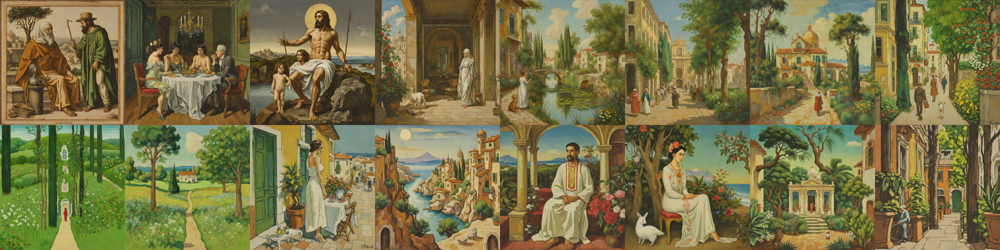

In [9]:
from diffusers.utils import make_image_grid

# Show best solution
for i, best_solution in enumerate(best_solutions):
    print(f"Highest scoring solution for epoch {art_styles[i]}: {best_solution.fitness}")

make_image_grid([image for solution in best_solutions for image in solution.result.images], 2, batch_size * len(best_solutions) // 2)

## Print the history of a solution

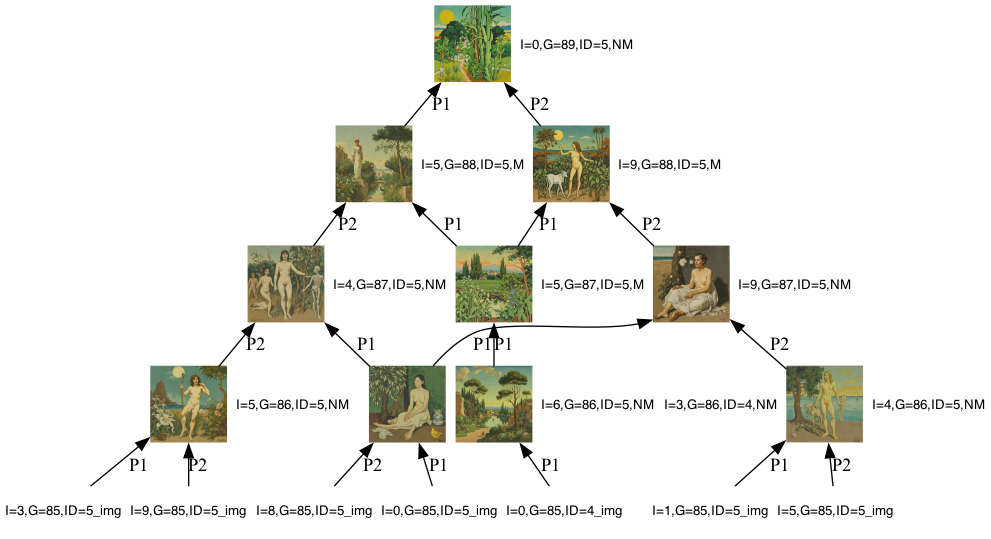

In [25]:
from IPython.display import IFrame, display
from evolutionary.history import SolutionHistoryKey, SolutionHistoryItem
from evolutionary_imaging.family_tree import visualize_family_tree
from PIL import Image

history_format = "png" # Supports graphviz formats
history_key = SolutionHistoryKey(index=0, generation=89, ident=5) # Index, Generation, Ident of Island
dot = visualize_family_tree(history=island_model.statistics.solution_history, root_key=history_key, depth=3, format=history_format, with_labels=True)
history_path = dot.render(filename="family_tree", cleanup=True, format=history_format)
Image.open(history_path) # PNG
#display(IFrame("family_tree.pdf", width=1000, height=1000)) # PDF
#print(island_model.statistics.history_string(key=history_key, depth=3)) # Textual

In [109]:
# One cell solution to print all history items from generation 10 or above
# that have a parent or grandparent with a different ident than their own.
# Access the history via island_model.statistics.solution_history.
# Proof that migration is happening

def has_different_ancestor(item, history):
    orig_ident = item.ident
    # Check immediate parents.
    for parent_key in (item.parent_1, item.parent_2):
        if parent_key:
            parent = history.get(parent_key)
            if parent and parent.ident != orig_ident:
                return True
    return False

def search_history(history):
    # Return items from generation 10+ that have a parent or grandparent with a different ident.
    return [
        item for item in history.values()
        if item.generation >= 10 and has_different_ancestor(item, history)
    ]

# Access the history dictionary.
history = island_model.statistics.solution_history

# Search for matching items.
matches = search_history(history)

# Print each matching item.
for item in matches:
    print(item)

SolutionHistoryItem(HistoryKey(index=3, generation=12, ident=0)) - No Mutation, P1: HistoryKey(index=5, generation=11, ident=0), P2: HistoryKey(index=0, generation=11, ident=15)
SolutionHistoryItem(HistoryKey(index=4, generation=12, ident=0)) - No Mutation, P1: HistoryKey(index=0, generation=11, ident=15), P2: HistoryKey(index=0, generation=11, ident=15)
SolutionHistoryItem(HistoryKey(index=8, generation=22, ident=0)) - No Mutation, P1: HistoryKey(index=8, generation=21, ident=0), P2: HistoryKey(index=2, generation=21, ident=15)
SolutionHistoryItem(HistoryKey(index=9, generation=22, ident=0)) - No Mutation, P1: HistoryKey(index=2, generation=21, ident=15)
SolutionHistoryItem(HistoryKey(index=1, generation=57, ident=0)) - No Mutation, P1: HistoryKey(index=3, generation=56, ident=15)
SolutionHistoryItem(HistoryKey(index=2, generation=57, ident=0)) - No Mutation, P1: HistoryKey(index=3, generation=56, ident=15)
SolutionHistoryItem(HistoryKey(index=1, generation=92, ident=0)) - No Mutation

## Visualize Embeddings with the Tensorboard Embedding Projector

In [18]:
# This will save the embeddings and the metadata to your disk
visualizer.generate_visualization(
    sprite_single_image_dim=(80, 80),
    filter_predicate=lambda e, l, i: int(l[0]) < 3, # Adjust this to filter embeddings if needed
)

Including default embeddings.
Including pooled embeddings.
Including combined average embeddings.
Including combined appended embeddings.
Total saved checkpoint size: 1.80 GB
Run 'tensorboard --logdir=vis' to visualize your embeddings.


In [19]:
%load_ext tensorboard
%tensorboard --logdir={visualizer.output_folder}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## Create a video from the generational progress showing the top images for each island

In [ ]:
for gen in range(island_model.completed_generations):
    create_generation_image_grid(gen, images_per_row=4, max_images=16, label_fontsize=10, ident_mapper=art_styles, group_by_ident=True)

In [ ]:
video_loc = create_animation_from_generations(island_model.completed_generations)
print(video_loc)

## Plot statistics

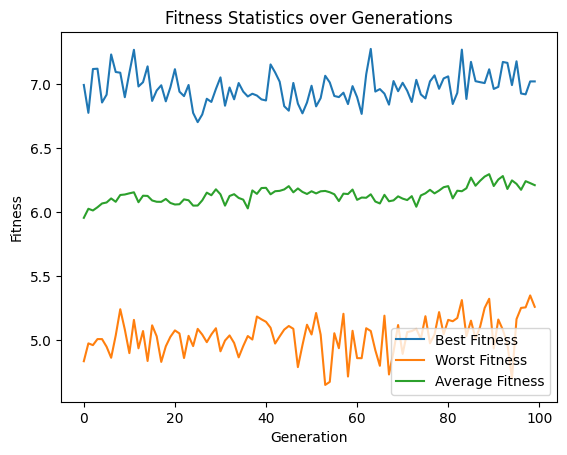

In [20]:
stats = island_model.statistics
plot_fitness_statistics(island_model.completed_generations, stats.best_fitness, stats.worst_fitness, stats.avg_fitness)

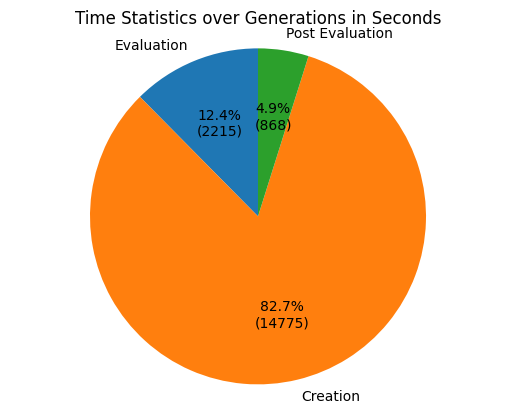

In [21]:
plot_time_statistics(stats.evaluation_time, stats.creation_time, stats.post_evaluation_time)